# Creating RGB Images
### By Elko Gerville-Reache and Annie Giman

When reducing CCD images, astronomical images are simply "intensity matrices" which means they don't show color. However, there are beautiful colorful Hubble and James Webb images being released all the time. How does that work?

In astrophysics research, color images are a composite of different science frames, which are raw images captured with a telescope. Each science frame is captured with a monochrome CCD camera, with a filter placed in front of the aperture which only lets a very specific range of wavelengths through. The individual frames used to create a color image are reduced before combination in the same way we did it above.

Let's produce one of these color images here! The data below was captured with the James Webb Space Telescope (JWST) using the Near-Infrared Camera (NIRCam) and is publically available$^2$. Each final image you will see below is comprised of 3 different Near-Infrared bands ranging from 2.2-5.1 microns overlayed onto each other. In this case, 3 JWST filter bands were chosen:

* F277W (2.2-3.5 microns), our "blue"
* F356W (3.9-4.2 microns), our "green"
* F444W (3.6-5.1 microns), our "red"

Since humans cannot see the infrared portion of the electromagnetic spectrum, each band is assigned a color: the shortest IR band (closest to blue) is colored blue, the next yellow, and the last red. The result is a false-color near-infrared image. for RGB image purposes, we treat these as blue, green, and red respectively. Each band highlights a specific feature of the galaxy, from star formation to dust lanes. Infrared imaging is an incredibly powerful tool for astrophysicists since galaxies are filled with gas and dust lanes, which block out visible light but do not absorb infrared radiation. Imaging in infrared bands allow researchers to see through dust and gas, revealing hidden star formation clusters and other features.

Just like above, we start by reading in the data

In [24]:
#Read in data. Each file corresponds to an image taken with a specific filter band
#F277W (2.2-3.5 microns)
b_img = fits.getdata("jw02727-o002_t062_nircam_clear-f277w_i2d.fits")
#F356W (3.9-4.2 microns)
g_img = fits.getdata("jw02727-o002_t062_nircam_clear-f356w_i2d.fits")
#F444W (3.6-5.1 microns)
r_img = fits.getdata("jw02727-o002_t062_nircam_clear-f444w_i2d.fits")

We can use the python "imshow" command to view our raw science frames. Keep in mind these frames are not actually raw and first had to go through a reduction process similar to the steps demonstrated above. The three different bands are displayed below; it is clear each frame is a monochromatic image. Combining the three images will yield a color image! The images have been scaled down sequentially in brightness to demonstrate different features of the galaxy. Star formation is clearer in the first frame, while the extremely bright spiral structures and galaxy cores are more apparent in the next two images. Doing this does not change the data; it is purely for visual effect. The second row contains matching images to the ones above but uses different color scales to make thinking of this change from monochrome to color a little more intuitive.

As a note, the figure below is itself a 2x3 matrix of six axes!

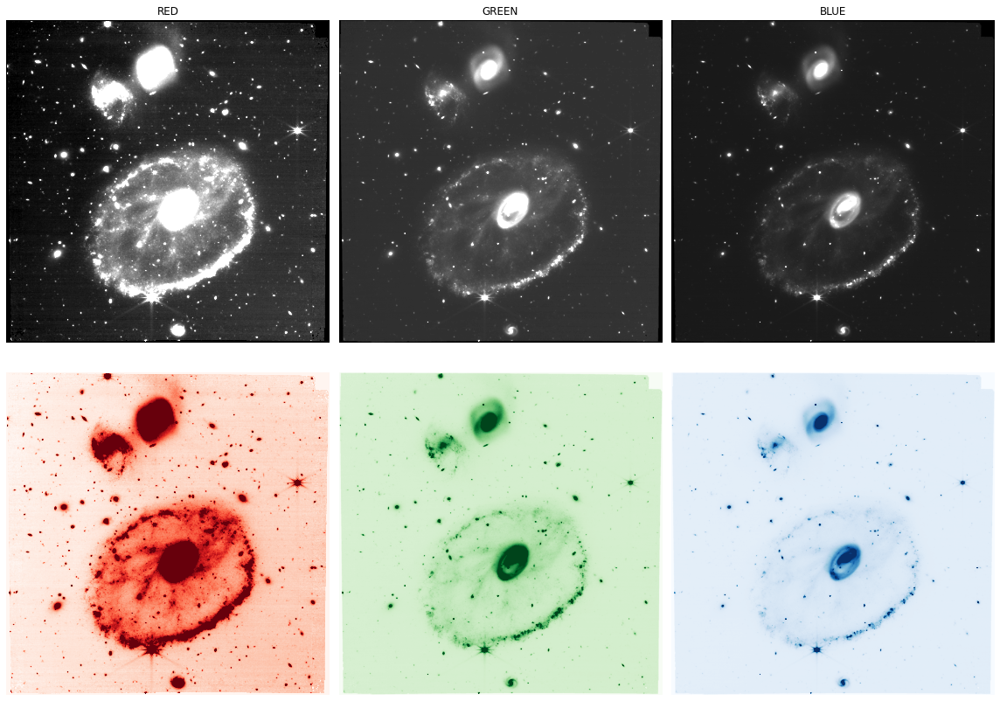

In [25]:
fig, axs = plt.subplots(2, 3, sharey = True, layout="tight", figsize=(16, 12))
fig.tight_layout()

# Plot on each axis
axs[0,0].imshow(r_img, vmin = np.percentile(r_img, 5), vmax = np.percentile(r_img, 95), cmap = "gray")
axs[0,1].imshow(g_img, vmin = np.percentile(g_img, 1), vmax = np.percentile(g_img, 99), cmap = "gray")
axs[0,2].imshow(b_img, vmin = np.percentile(b_img, .5), vmax = np.percentile(b_img, 99.6), cmap = "gray")
axs[1,0].imshow(r_img, vmin = np.percentile(r_img, 5), vmax = np.percentile(r_img, 95), cmap = "Reds")
axs[1,1].imshow(g_img, vmin = np.percentile(g_img, 1), vmax = np.percentile(g_img, 99), cmap = "Greens")
axs[1,2].imshow(b_img, vmin = np.percentile(b_img, .5), vmax = np.percentile(b_img, 99.6), cmap = "Blues")

# Add labels
axs[0,0].title.set_text("RED")
axs[0,1].title.set_text("GREEN")
axs[0,2].title.set_text("BLUE")

# Turn off tick marks for all these images
for i in range(2):
    for j in range(3):
        axs[i,j].axis("off")

Here we write the code that will merge the science frames into a color image. The way this is done is with linear scaling of each channel. A minimum and maximum value are chosen for each science frame and any intensity value in the matrix array that is not bounded by this interval is clipped. This means values above the maximum are lowered to the maximum value and values below the minimum are raised to the minimum value of the interval.

In [26]:
#Define function that performs linear scaling of color channels
def linear1(inputArray, scale_min=None, scale_max=None):
    imageData=np.array(inputArray, copy=True)

    if scale_min == None:
        scale_min = imageData.min()
    if scale_max == None:
        scale_max = imageData.max()

    imageData = imageData.clip(min=scale_min, max=scale_max)
    imageData = (imageData -scale_min) / (scale_max - scale_min)
    return imageData

Astronomers are not limited to linear scaling. Other functions such as inverse hyperbolic sine scaling are often used in order to tweak even finer details out of the galaxy. This code was borrowed for demonstrational purposes from Min-Su Shin at the University of Michigan$^4$.

In [27]:
#Define function that performs inverse hyperbolic sine scaling of color channels
from astropy.utils.data import get_pkg_data_filename

def asinh(inputArray, scale_min=None, scale_max=None, non_linear=2.0):

    imageData=np.array(inputArray, copy=True)
    
    if scale_min == None:
        scale_min = imageData.min()
    if scale_max == None:
        scale_max = imageData.max()
    factor = np.arcsinh((scale_max - scale_min)/non_linear)
    indices0 = np.where(imageData < scale_min)
    indices1 = np.where((imageData >= scale_min) & (imageData <= scale_max))
    indices2 = np.where(imageData > scale_max)
    imageData[indices0] = 0.0
    imageData[indices2] = 1.0
    imageData[indices1] = np.arcsinh((imageData[indices1] - \
    scale_min)/non_linear)/factor

    return imageData

We are finally ready to create an RGB image. The three science frames (r, g, b) are loaded into the program as r_img, g_img, and b_img. The first step is creating a new matrix comprised solely of zeros, which we call "img." This is a 3-dimensional matrix, so we'll have to take a "slice" in order to display it here. Each color channel is then added to this new array after being scaled accordingly, as specified by "scale_min" and "scale_max."

This is similar to the idea of making a matrix of matrices, close to how a matrix is a combination of column or row vectors. Here, we're taking each individual filter as a 2D matrix and creating a 3D matrix composed of them. This is something very easy for computers to do, but very hard for a person to do.

In [28]:
#Linear scaling
r_img = fits.getdata("jw02727-o002_t062_nircam_clear-f444w_i2d.fits")
g_img = fits.getdata("jw02727-o002_t062_nircam_clear-f356w_i2d.fits")
b_img = fits.getdata("jw02727-o002_t062_nircam_clear-f277w_i2d.fits")
img = np.zeros((r_img.shape[0], r_img.shape[1], 3), dtype=float)

Let's see what this matrix looks like:

In [29]:
print(img[18:19,10:20,0:20])

[[[0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]
  [0. 0. 0.]]]


And now let's try adding just the blue channel:

In [30]:
img[:,:,0] = linear1(b_img, scale_min=.03, scale_max=np.percentile(b_img,99.15))
print(img[18:19,10:20,0:20])

[[[0.         0.         0.        ]
  [0.1159201  0.         0.        ]
  [0.1174404  0.         0.        ]
  [0.10462885 0.         0.        ]
  [0.1047235  0.         0.        ]
  [0.0961684  0.         0.        ]
  [0.10598926 0.         0.        ]
  [0.12627521 0.         0.        ]
  [0.10639395 0.         0.        ]
  [0.08744472 0.         0.        ]]]


And now let's finish by adding green and red:

In [31]:
img[:,:,1] = linear1(g_img, scale_min=.04, scale_max=np.percentile(g_img,99.2))
img[:,:,2] = linear1(r_img, scale_min=.24, scale_max=np.percentile(r_img,99.25))

Keep in mind this array has been indexed or shortened to not show the entirety of the data, which is very long. The indexing is done with square brackets.

In [32]:
#Display matrix with all color channels added
print(img[18:19,10:20,0:20])

[[[0.         0.         0.        ]
  [0.1159201  0.09915214 0.13936852]
  [0.1174404  0.11881351 0.16293423]
  [0.10462885 0.12546495 0.17835344]
  [0.1047235  0.11955103 0.16789298]
  [0.0961684  0.12117675 0.15735948]
  [0.10598926 0.13622263 0.14045592]
  [0.12627521 0.12065508 0.10435163]
  [0.10639395 0.09943005 0.11167856]
  [0.08744472 0.10366536 0.12002095]]]


As illustrated above, the "img" array starts out as an empty matrix with zeros for all entries. Each time the linear function is used, the input array (r_img, g_img, b_img) is scaled linearly by the function, and the new values are added to a column in the zero matrix. The result is a new matrix array where each column corresponds to one of the individual science frames. In other words, this new matrix has one column for red, green, and blue. This new array is a color image!

The image below is the completed false-color Near-IR image of the Cartwheel Galaxy. We can see the bright nucleus in the center of the galaxy-comprised of hot dust and star clusters- and the stellar disk surrounding it. The outer ring shows a plethora of star formations, indicating the presence of young stars! This galaxy underwent a collision and is in a transitory stage, hence the unusual appearance. We can also observe the two neighboring spiral galaxies in the upper right corner.

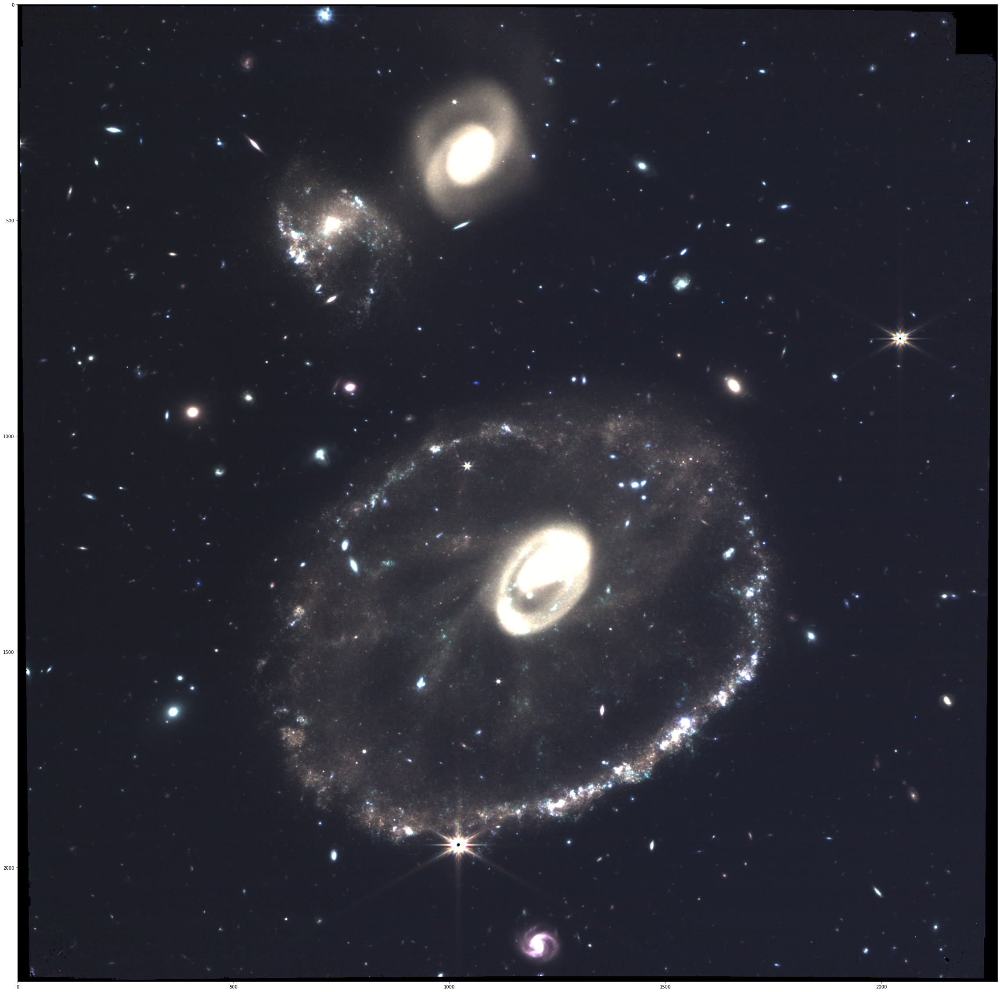

In [33]:
fig = plt.figure(figsize = (40, 80))
py.imshow(img, aspect='equal', vmin=0, vmax=1)

Let's take a look at another type of scaling. Using ASIHN scaling, the finer details of the galaxy such as the faint dust lanes are more visible. This image looks a little closer to the official JWST image released by NASA, pictured below the ASIHN scaled image.

<Figure size 432x288 with 0 Axes>

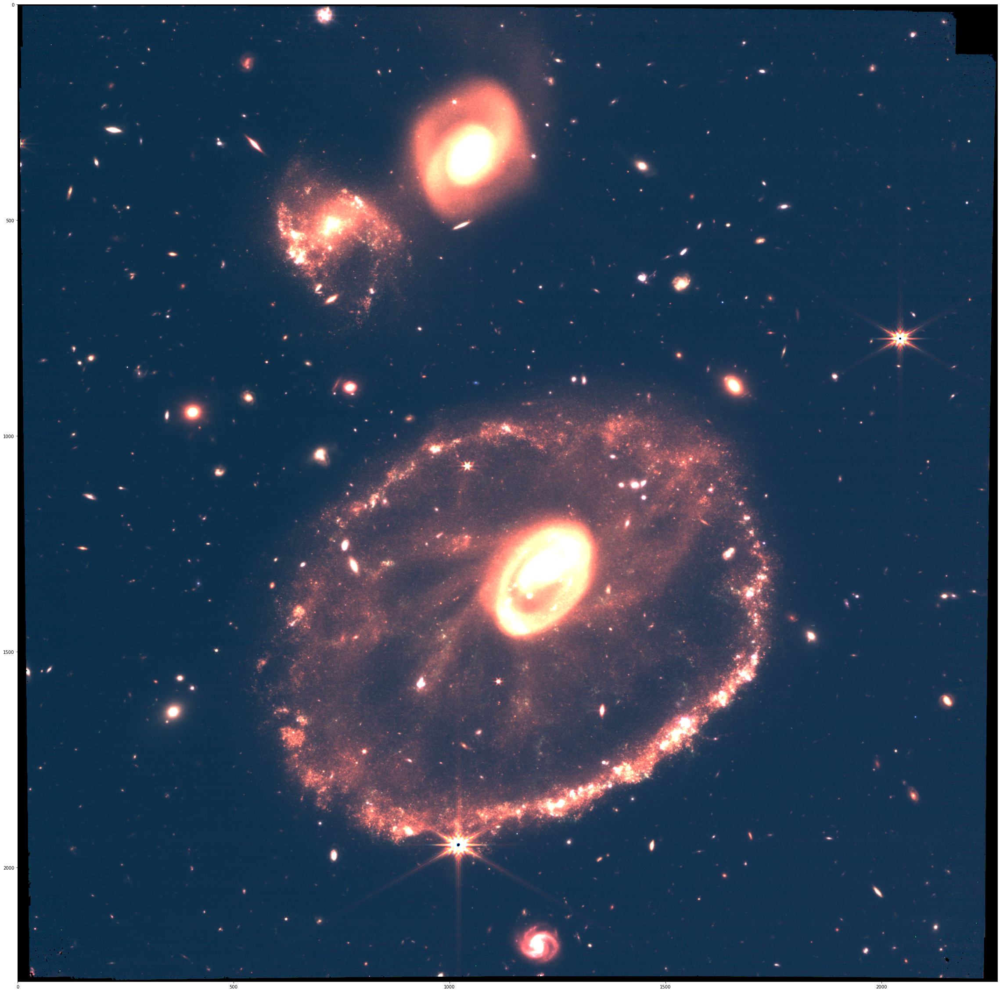

In [34]:
#ASIHN scaling
r_img = fits.getdata("jw02727-o002_t062_nircam_clear-f444w_i2d.fits")
g_img = fits.getdata("jw02727-o002_t062_nircam_clear-f356w_i2d.fits")
b_img = fits.getdata("jw02727-o002_t062_nircam_clear-f277w_i2d.fits")
img = np.zeros((r_img.shape[0], r_img.shape[1], 3), dtype=float)
img[:,:,0] = asinh(b_img, scale_min=.1, scale_max=np.percentile(b_img,97))
img[:,:,1] = asinh(g_img, scale_min=0, scale_max=np.percentile(g_img,99))
img[:,:,2] = asinh(r_img, scale_min=.1, scale_max=np.percentile(r_img,99.5))
py.clf()
fig = plt.figure(figsize = (40, 80))
py.imshow(img, aspect='equal', vmin=0, vmax=1)

We were able to get a really cool color image by just combining those three filter images!

In many ways, producing color astronomical images is an art as well as a science. It requires a lot of experimentation to find the right scaling, filters, data range, and lots else. There are many, many people at NASA whose jobs are to produce these images. Let's see what the JWST NASA team's image looks like:

https://webbtelescope.org/contents/media/images/2022/039/01G8JXN0K2VBQP112RNSQWTCTH

The color channels are noticeably more balanced, and it is clear this image is a composite of different images. Mixing color channels is a fine art difficult to master, but results in spectacular space panoramas!

As you can see, linear algebra is a foundational element of modern astrophysics research. Without matrix manipulation, we'd stil be using photographic plates, and the ability to empirically examine data would be severely limited. Matrices are in many ways the language of observational astronomy. Though we don't call it "linear algebra" or regularly describe images as matrices, that's exactly what it is. The more we understand linear algebra, the more we understand the processes that we rely on to conduct our research.

# References and Notes

$^1$<span id="fn1">This data was given to us for an Astr 255 assignment. We're using it here with the permission of Professor Héctor Arce.</span>

$^2$<span id="fn2">https://mast.stsci.edu/portal/Mashup/Clients/Mast/Portal.html</span>

$^3$<span id="fn3">https://jwst-docs.stsci.edu/jwst-near-infrared-camera/nircam-instrumentation/nircam-filters</span>

$^4$<span id="fn4">https://github.com/sciserver/Notebooks/blob/master/required-files/img_scale.py</span>